In [2]:
!pip install japanize_matplotlib

     |████████████████████████████████| 4.1MB 5.1MB/s 
  Created wheel for japanize-matplotlib: filename=japanize_matplotlib-1.1.3-cp37-none-any.whl size=4120276 sha256=c9e7b6b77260e4bcf509f85c4146b2bae42b63aed80a3621a56d347277404425
  Stored in directory: /root/.cache/pip/wheels/b7/d9/a2/f907d50b32a2d2008ce5d691d30fb6569c2c93eefcfde55202
Successfully built japanize-matplotlib


In [3]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import japanize_matplotlib
from datetime import datetime
import numpy as np
from fastprogress import progress_bar as pb
import seaborn as sns
sns.set(font="IPAexGothic")

In [4]:
df_stocklist = pd.read_csv('/content/drive/MyDrive/data/stocklist/stocklist.csv')

In [5]:
FILEPATH_FMT = '/content/drive/MyDrive/data/stockprice/stooq/{code}.csv'

In [9]:
codes = df_stocklist['銘柄コード'].unique()

In [15]:
df_dict = {}
skipped_code = []

for code in pb(codes):
    try:
        df_dict[code] = pd.read_csv(FILEPATH_FMT.format(code=code), index_col='Date', parse_dates=True)
    except Exception:
        skipped_code.append(code)

In [19]:
valid_codes = list(set(codes) - set(skipped_code))

In [10]:
!pip install tslearn

     |████████████████████████████████| 798kB 6.2MB/s 


In [11]:
np.random.seed(seed=44)

In [28]:
random_codes = np.random.choice(valid_codes, 500, replace=False)

In [29]:
MIN_DT = pd.to_datetime('2018-01-01')
MAX_DT = pd.to_datetime('2020-12-01')

In [42]:
pd.DataFrame(index=pd.bdate_range(MIN_DT, MAX_DT, freq=pd.tseries.offsets.BDay()))

""
2018-01-01
2018-01-02
2018-01-03
2018-01-04
2018-01-05
...
2020-11-25
2020-11-26
2020-11-27
2020-11-30


In [68]:
df_closes = pd.DataFrame(index=pd.bdate_range(MIN_DT, MAX_DT, freq=pd.tseries.offsets.BDay()))

for code in pb(random_codes):
    if df_dict[code].Close.index.min() > MIN_DT or df_dict[code].Close.index.max() < MAX_DT:
        continue
    
    df_tmp = pd.merge(
         pd.DataFrame(index=pd.bdate_range(MIN_DT, MAX_DT, freq=pd.tseries.offsets.BDay())),
         df_dict[code].Close,
         how='left',
         left_index=True, right_index=True
    )
    if df_tmp['Close'].isnull().sum() > 70:  # nanが多すぎる銘柄は除外
        continue
    df_closes = pd.merge(
        df_closes, df_dict[code].Close.rename(f'{code}'),
        left_index=True, right_index=True,
        how='left'
    )

In [69]:
df_closes

,6957,2675,9928,3242,2685,8154,8714,5852,4576,1946,1401,3571,4820,6278,6175,9629,9602,8358,6482,5923,9972,2175,3053,2686,6969,3689,2148,3333,3837,3640,3079,5915,3856,6376,6958,6629,7180,4092,4732,1882,...,9386,4800,2432,8081,6908,8393,2612,9421,3691,7561,3695,3692,6870,8508,3965,6552,1885,4404,9735,3843,4978,2531,2174,1972,4220,4350,3630,6867,8952,4828,6836,7162,3355,1870,4290,6701,5698,3853,4917,3191
2018-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-04,4961.79,1689.49,3012.51,298.77,2066.47,2957.42,379.98,832.02,510.0,3201.12,814.0,1023.30,624.73,4000.22,907.86,1740.63,3948.38,2327.41,1556.15,2997.28,371.28,1775.38,4873.45,775.46,813.0,1847.0,706.35,1281.75,1174.66,2446.35,1293.66,2448.46,764.86,1208.18,1037.59,506.78,671.47,2454.39,2281.03,4056.79,...,1282.08,349.24,2260.12,1356.43,6599.06,3509.05,6270.28,1740.17,1364.0,1095.13,2131.93,3990.0,1519.51,748.87,1724.48,1860.0,2886.02,1409.54,8234.91,1140.73,321.0,1281.98,1008.09,3699.95,586.55,567.08,2024.31,738.77,535000.0,1761.38,5440.0,403.26,1257.10,891.68,688.68,2941.23,812.82,1134.08,3592.37,1704.32
2018-01-05,4914.44,1689.49,3026.97,299.65,2047.12,2957.42,382.63,844.81,512.0,3219.78,857.0,1025.11,631.42,3938.47,955.41,1757.01,3919.16,2371.70,1575.22,3010.95,383.84,1753.12,4785.73,775.46,821.0,1834.0,690.06,1296.27,1173.69,2428.23,1284.14,2444.79,802.62,1225.45,1061.30,503.86,671.47,2436.51,2287.58,4052.27,...,1293.36,356.92,2284.01,1364.77,6782.91,3536.12,6335.99,1783.38,1463.0,1106.04,2130.08,4055.0,1513.95,747.89,1709.82,1835.0,2933.64,1404.88,8249.11,1154.42,318.0,1301.01,1015.22,3717.56,592.10,578.34,2007.73,736.86,529000.0,1766.18,5450.0,402.29,1296.53,895.30,679.41,2955.49,836.13,1200.73,3620.89,1721.08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-25,2624.00,1211.00,2081.00,267.00,1830.00,2097.00,158.00,328.00,329.0,3645.00,645.0,929.00,827.00,3165.00,592.00,4550.00,4565.00,356.00,712.00,2565.00,292.04,3500.00,270.00,440.00,457.0,1312.0,2329.00,1602.00,2894.00,2418.00,1065.00,1614.00,2638.00,1017.00,401.00,693.00,528.00,2489.00,2259.00,3630.00,...,1790.00,1228.00,1802.00,1300.00,4440.00,2376.00,3870.00,1045.00,638.0,905.00,1807.00,2393.0,1470.00,206.00,927.00,570.0,1957.00,1230.00,10370.00,908.00,373.0,1201.00,730.00,2609.00,440.00,698.00,3300.00,722.00,532000.0,3250.00,1438.0,334.00,671.00,876.00,966.00,5550.00,566.00,1019.00,1731.00,1470.00
2020-11-26,2790.00,1211.00,2073.00,267.00,1825.00,2204.00,157.00,333.00,329.0,3685.00,653.0,925.00,840.00,3265.00,581.00,4570.00,4575.00,356.00,759.00,2558.00,296.00,3595.00,271.00,440.00,397.0,1365.0,2372.00,1588.00,2937.00,2420.00,1059.00,1638.00,2873.00,999.00,423.00,721.00,534.00,2507.00,2235.00,3640.00,...,1809.00,1248.00,1807.00,1298.00,4440.00,2439.00,3870.00,1000.00,625.0,915.00,1797.00,242

In [70]:
df_closes.isnull().sum().sort_values()

6957    55
6513    55
2819    55
3159    55
4584    55
        ..
5386    66
7879    67
8040    67
6870    68
3710    70
Length: 406, dtype: int64

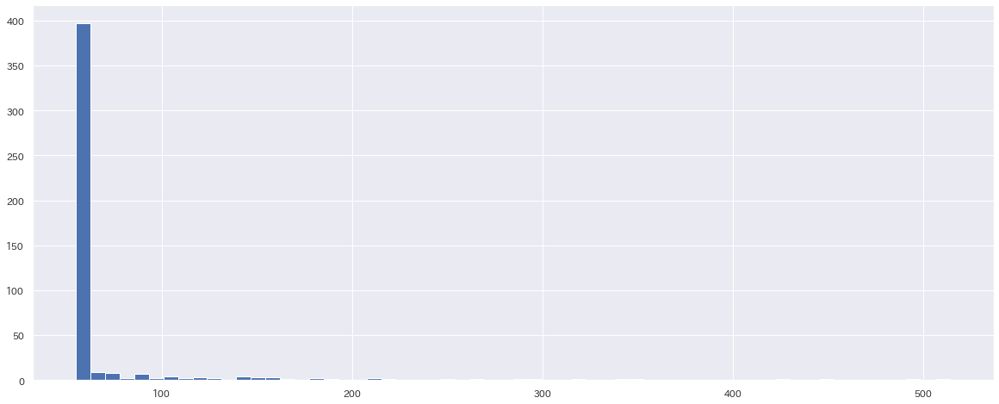

In [65]:
plt.figure(figsize=(20, 8))
df_closes.isnull().sum().hist(bins=60)

In [60]:
from tslearn.clustering import KShape
from tslearn.preprocessing import TimeSeriesScalerMeanVariance

/usr/local/lib/python3.7/dist-packages/tslearn/clustering/kmeans.py:17: UserWarning: Scikit-learn <0.24 will be deprecated in a future release of tslearn
  "Scikit-learn <0.24 will be deprecated in a "


In [123]:
X_train = TimeSeriesScalerMeanVariance(mu=0.,std=1.).fit_transform(df_closes.fillna(df_closes.mean()).T)

In [124]:
N_CLUSTERS = 10

In [125]:
ks = KShape(n_clusters=N_CLUSTERS)
ks.fit(X_train)

KShape(init='random', max_iter=100, n_clusters=10, n_init=1, random_state=None,
       tol=1e-06, verbose=False)

In [89]:
y_pred = ks.fit_predict(X_train)

In [90]:
y_pred

array([5, 1, 4, 4, 0, 3, 5, 5, 1, 8, 6, 7, 8, 6, 7, 8, 0, 6, 6, 6, 3, 8,
       5, 1, 6, 0, 2, 0, 8, 7, 5, 5, 2, 4, 1, 2, 3, 3, 9, 7, 3, 7, 5, 6,
       3, 6, 6, 6, 0, 8, 6, 5, 0, 1, 1, 8, 4, 3, 3, 0, 9, 3, 7, 3, 5, 0,
       5, 1, 9, 1, 4, 4, 5, 5, 3, 1, 2, 2, 4, 5, 7, 1, 2, 9, 2, 0, 8, 3,
       4, 6, 1, 7, 7, 8, 4, 0, 3, 3, 0, 3, 3, 0, 5, 1, 3, 1, 0, 5, 8, 3,
       3, 7, 5, 0, 6, 4, 7, 7, 3, 6, 8, 6, 3, 2, 2, 6, 7, 6, 8, 6, 6, 3,
       9, 6, 3, 8, 3, 3, 3, 5, 5, 6, 8, 1, 5, 9, 6, 2, 7, 7, 3, 6, 2, 7,
       6, 0, 6, 1, 8, 5, 4, 6, 0, 6, 8, 3, 6, 5, 6, 2, 7, 8, 2, 6, 9, 3,
       3, 1, 0, 0, 1, 6, 1, 6, 4, 5, 9, 5, 3, 8, 8, 8, 6, 3, 1, 7, 6, 2,
       6, 1, 3, 3, 6, 3, 3, 5, 5, 5, 5, 3, 5, 2, 6, 8, 5, 7, 2, 8, 3, 3,
       1, 6, 2, 7, 0, 1, 2, 6, 2, 7, 3, 6, 2, 0, 5, 0, 1, 8, 0, 6, 1, 8,
       8, 6, 9, 7, 3, 4, 7, 7, 4, 8, 6, 1, 5, 8, 0, 6, 1, 8, 5, 0, 2, 0,
       2, 4, 3, 6, 8, 3, 2, 5, 2, 4, 4, 1, 1, 4, 5, 0, 2, 2, 8, 1, 1, 6,
       4, 6, 5, 0, 5, 9, 2, 6, 7, 3, 5, 6, 9, 4, 3,

In [91]:
len(y_pred)

406

In [113]:
df_cluster = pd.DataFrame({
    'code': df_closes.columns,
    'cluster': y_pred
})

In [114]:
df_cluster

,code,cluster
0,6957,5
1,2675,1
2,9928,4
3,3242,4
4,2685,0
...,...,...
401,6701,8
402,5698,6
403,3853,9
404,4917,1


In [94]:
from sklearn.preprocessing import MinMaxScaler

In [108]:
df_closes_scaled = pd.DataFrame(
    data=MinMaxScaler().fit_transform(df_closes),
    columns=df_closes.columns,
    index=df_closes.index
)

In [109]:
df_closes_scaled

,6957,2675,9928,3242,2685,8154,8714,5852,4576,1946,1401,3571,4820,6278,6175,9629,9602,8358,6482,5923,9972,2175,3053,2686,6969,3689,2148,3333,3837,3640,3079,5915,3856,6376,6958,6629,7180,4092,4732,1882,...,9386,4800,2432,8081,6908,8393,2612,9421,3691,7561,3695,3692,6870,8508,3965,6552,1885,4404,9735,3843,4978,2531,2174,1972,4220,4350,3630,6867,8952,4828,6836,7162,3355,1870,4290,6701,5698,3853,4917,3191
2018-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-04,0.718246,0.928981,0.710849,0.518195,0.535551,1.000000,0.953312,0.691540,0.504831,0.470473,0.191753,0.947458,0.261840,0.855435,0.708411,0.057249,0.505738,0.966484,0.807245,0.453132,0.761021,0.065949,0.703328,0.968870,0.872456,0.448472,0.117154,0.308912,0.002625,0.893793,0.821392,0.942960,0.124111,0.656013,0.962542,0.281960,0.974947,0.264464,0.904721,0.948408,...,0.437093,0.027159,0.949264,0.716776,0.876027,0.980553,0.814427,0.697430,0.767939,0.470491,0.711188,0.693820,0.870278,0.710105,0.363102,0.743032,0.912466,0.982561,0.338703,0.637739,0.449102,0.616760,0.961291,0.923625,0.966670,0.650905,0.095278,0.296222,0.111821,0.043875,0.936064,0.897463,0.834156,0.797404,0.331945,0.038495,0.576633,0.794478,0.891306,0.765431
2018-01-05,0.706975,0.928981,0.720389,0.522493,0.524516,1.000000,0.963242,0.707689,0.509662,0.484612,0.221306,0.955545,0.272632,0.827804,0.774231,0.060728,0.488989,0.987486,0.823481,0.459804,0.803548,0.055927,0.689978,0.968870,0.883311,0.442795,0.111005,0.323535,0.002098,0.870612,0.808448,0.940108,0.136782,0.677357,0.995830,0.278224,0.974947,0.258911,0.910891,0.945688,...,0.449144,0.032214,0.967917,0.731042,0.915951,0.995140,0.831082,0.724315,0.843511,0.497488,0.710089,0.712079,0.862084,0.708853,0.358551,0.730248,0.936778,0.973832,0.342905,0.652243,0.440120,0.634239,0.974761,0.932349,0.986668,0.679825,0.089970,0.294629,0.092652,0.045796,0.938062,0.893942,0.871570,0.807013,0.314393,0.042703,0.607680,0.855940,0.903614,0.782190
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-25,0.161754,0.288055,0.096296,0.363015,0.400697,0.430246,0.121553,0.055152,0.067633,0.806792,0.075601,0.526137,0.588124,0.481698,0.271186,0.653923,0.859170,0.031666,0.088545,0.242168,0.492720,0.842420,0.002739,0.204951,0.389417,0.214847,0.729708,0.631420,0.936962,0.857525,0.510510,0.294402,0.752684,0.419735,0.068794,0.520215,0.592971,0.275214,0.883967,0.691596,...,0.979702,0.605595,0.591571,0.620247,0.407171,0.370008,0.206055,0.264903,0.213740,0.000000,0.518122,0.245225,0.797312,0.016607,0.115556,0.083355,0.438152,0.646249,0.970413,0.391164,0.604790,0.542383,0.435928,0.383136,0.438619,0.987158,0.503725,0.282229,0.102236,0.639745,0.136464,0.646075,0.278020,0.755780,0.857013,0.808217,0.247886,0.688356,0.088036,0.531132
2020-11-26,0.201269,0.288055,0.091018,0.363015,0.397845,0

In [111]:
df_closes_scaled.max(axis=0)

6957    1.0
2675    1.0
9928    1.0
3242    1.0
2685    1.0
       ... 
6701    1.0
5698    1.0
3853    1.0
4917    1.0
3191    1.0
Length: 406, dtype: float64

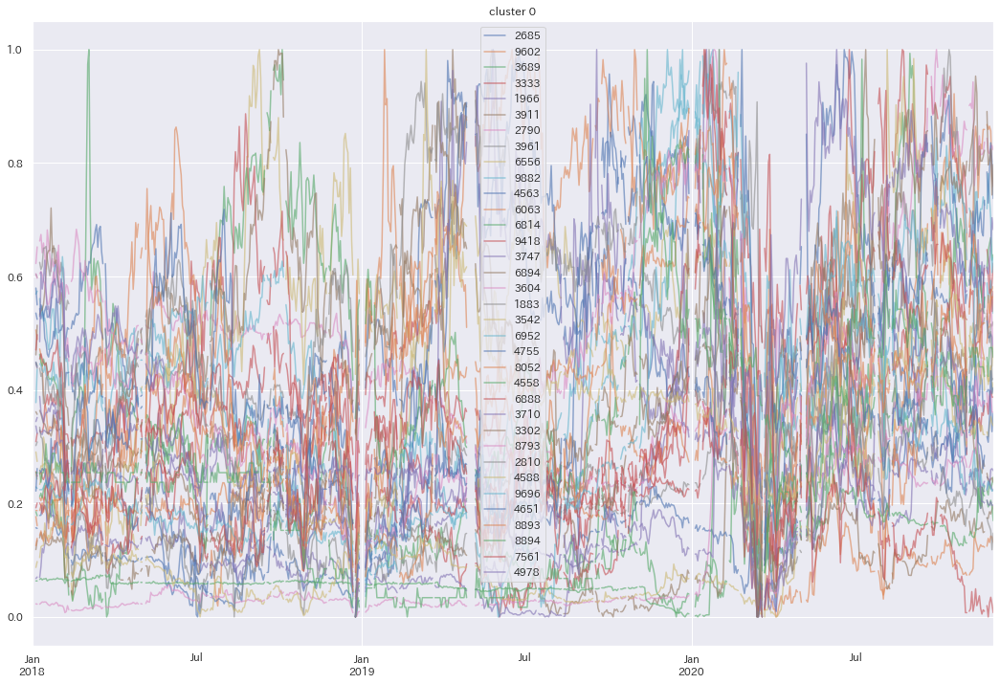

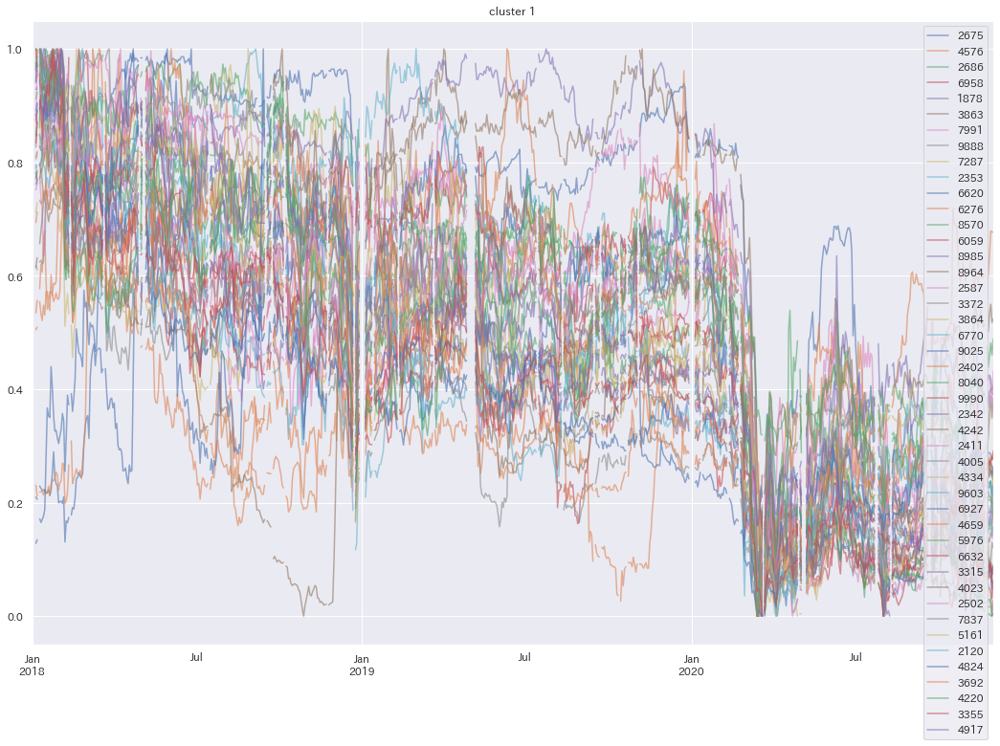

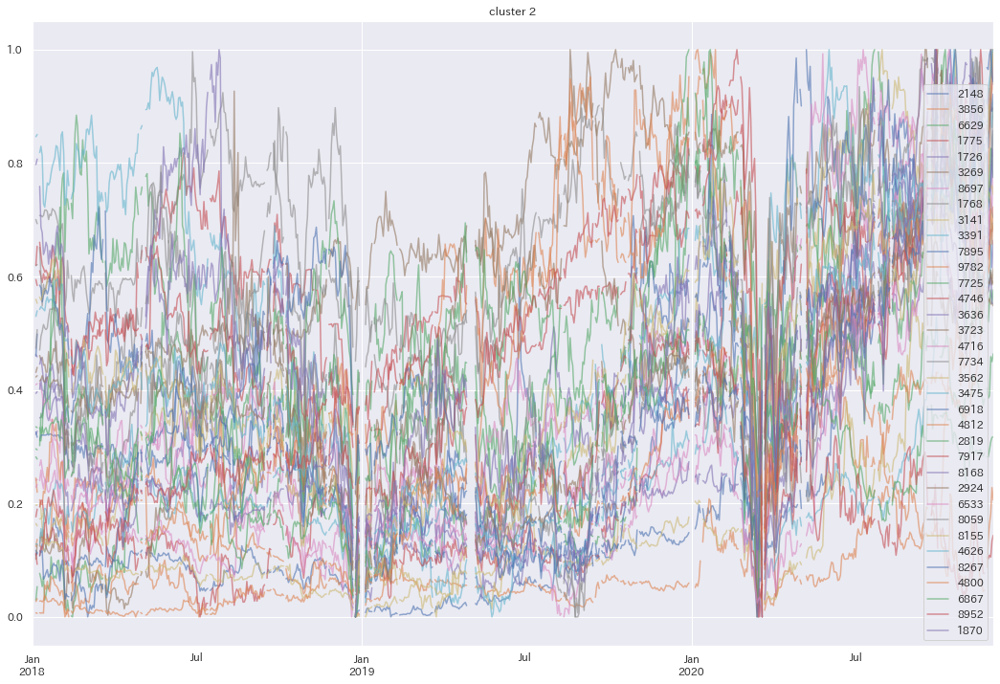

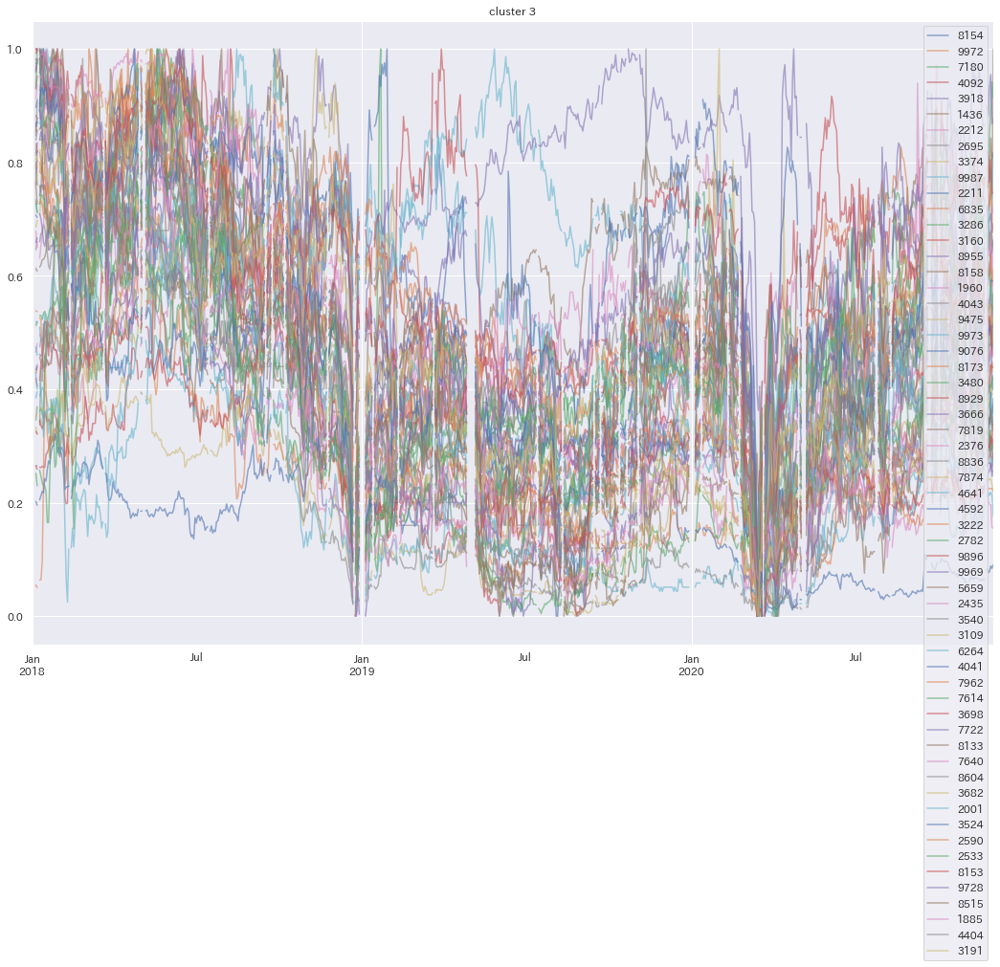

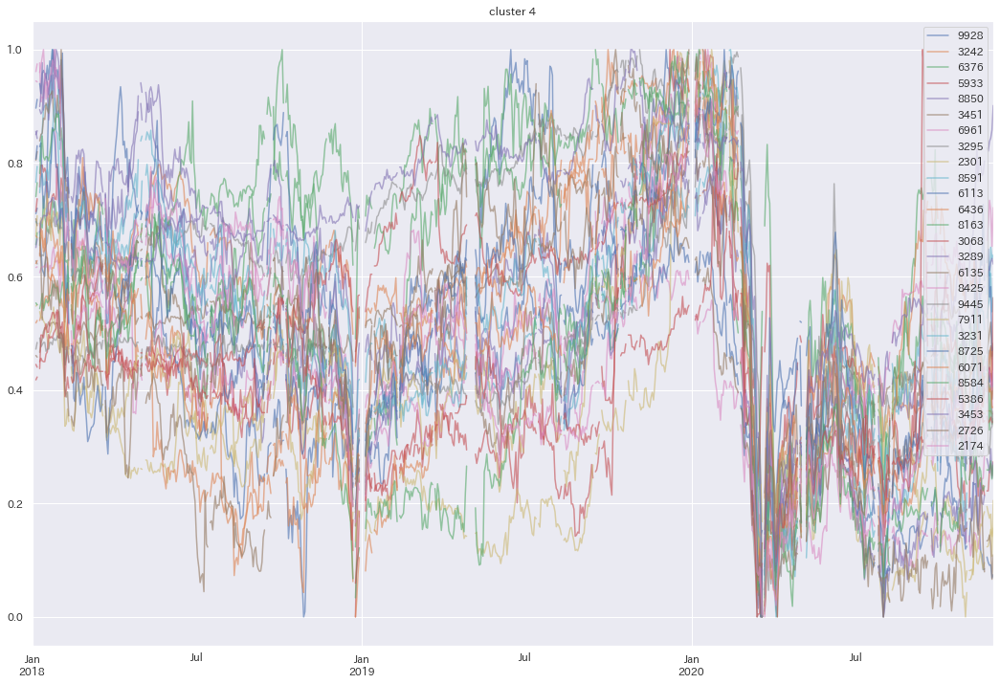

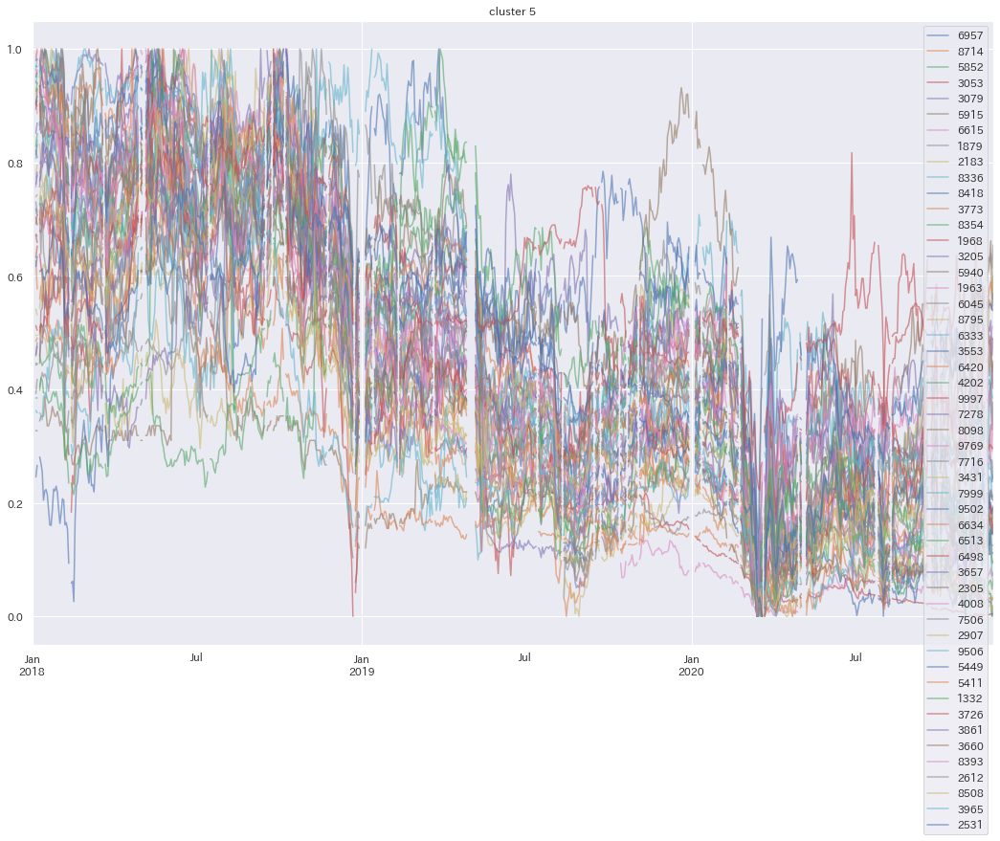

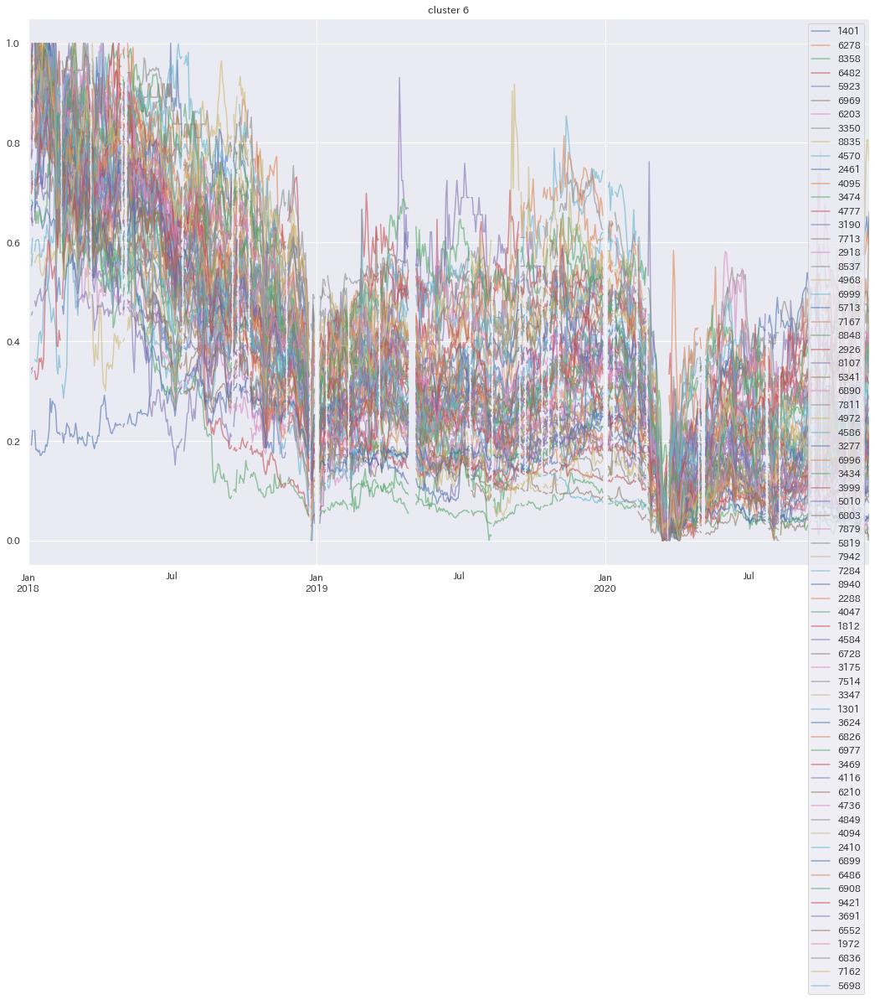

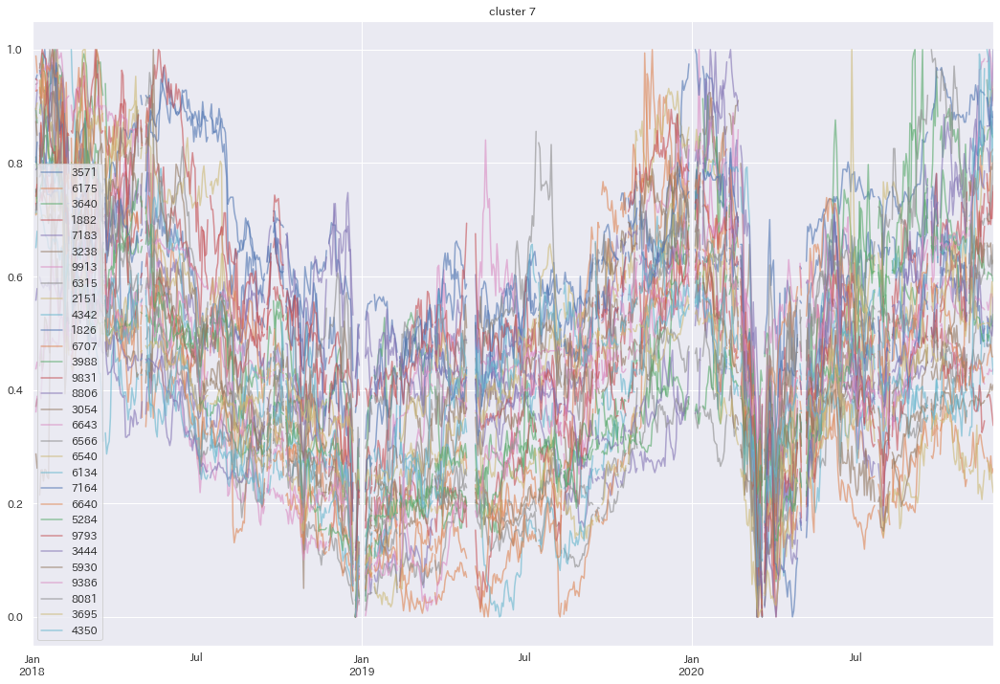

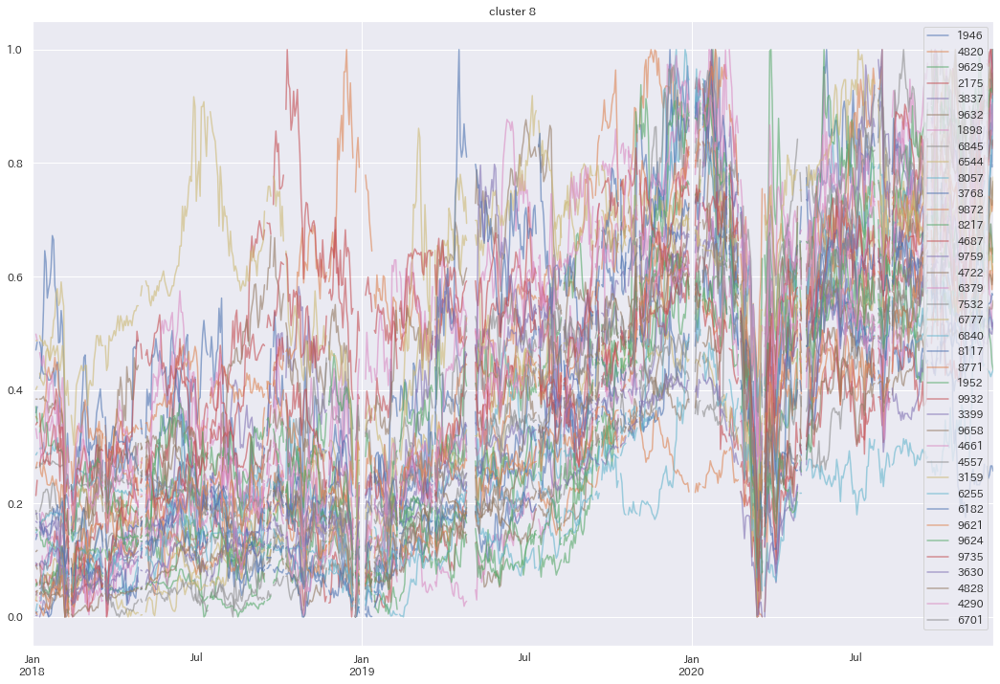

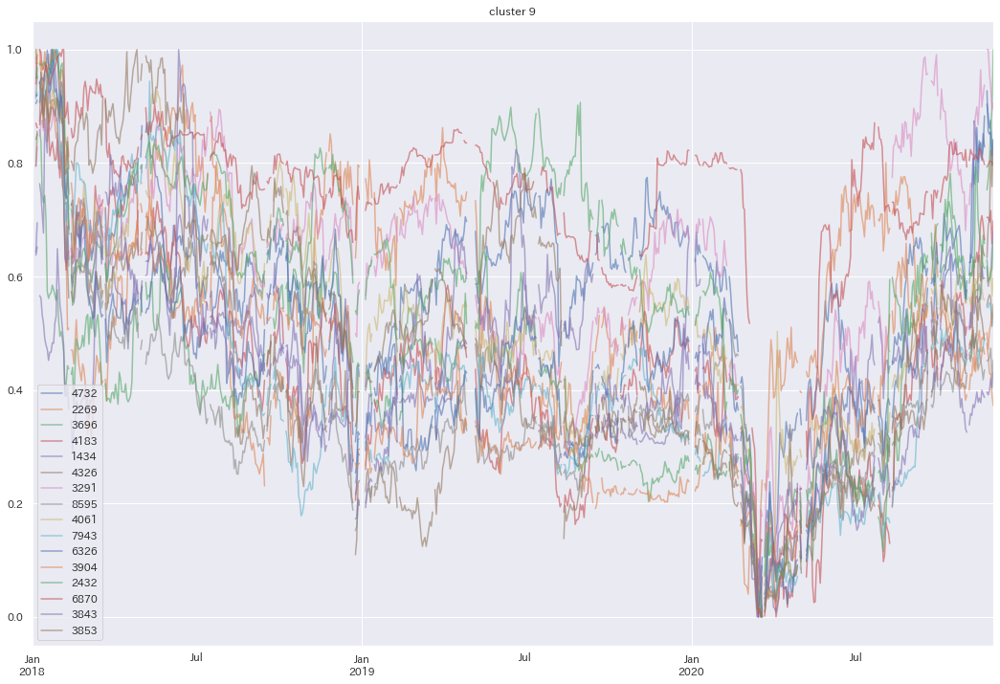

In [127]:

for cluster in range(N_CLUSTERS):
    cluster_codes = df_cluster[df_cluster['cluster']==cluster]['code'].tolist()
    df_closes_scaled[cluster_codes].plot(figsize=(18, 12), alpha=0.6)
    plt.title(f'cluster {cluster}')
    plt.show()

In [146]:
import numpy as np
import matplotlib.pyplot as plt

cm_name = 'hsv'
cm = plt.get_cmap(cm_name)

In [147]:
cm.N

256

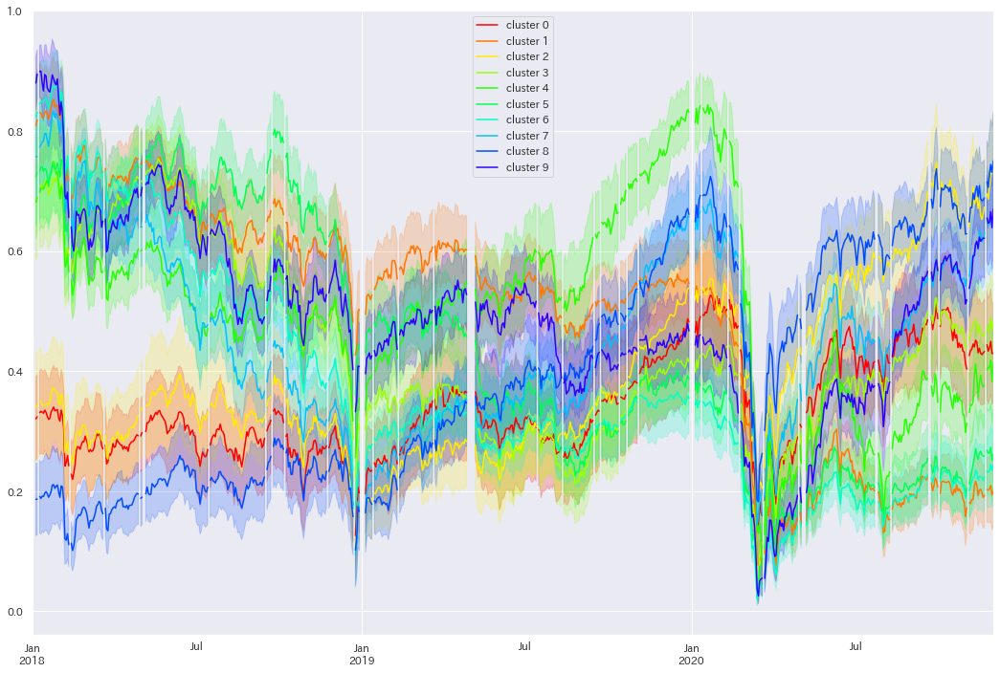

In [150]:

for cluster in range(N_CLUSTERS):
    cluster_codes = df_cluster[df_cluster['cluster']==cluster]['code'].tolist()
    df_closes_scaled[cluster_codes].mean(axis=1).plot(figsize=(18, 12), label=f'cluster {cluster}', c=cm(20*cluster))
    plt.fill_between(
        df_closes_scaled[cluster_codes].index,
        df_closes_scaled[cluster_codes].mean(axis=1)+0.4*df_closes_scaled[cluster_codes].std(axis=1),
        df_closes_scaled[cluster_codes].mean(axis=1)-0.4*df_closes_scaled[cluster_codes].std(axis=1),
        color=cm(20*cluster), alpha=0.2)
plt.legend()
plt.show()